In [ ]:
import tensorflow as tf

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    print('GPU device not found')
else:
    print('Found GPU at: {}'.format(device_name))


Found GPU at: /device:GPU:0


In [ ]:
!nvidia-smi

Fri Jul  5 15:29:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P0              29W /  70W |    103MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# !pip install nibabel

Mounted at /content/drive


In [ ]:
import nibabel as nib
import numpy as np
import os

# Define the folder containing the .nii files
folder_path = '/content/drive/My Drive/mni/'
#folder_path = r"C:\Users\manis\OneDrive\Documents\University of Surrey\Post Graduation\Dissertation\mni"

# List all files in the folder
file_names = [f for f in os.listdir(folder_path) if f.endswith('.nii')]

# Initialize a list to store the data
data_list = []

# Loop over all files and load them
for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    img = nib.load(file_path)
    data = img.get_fdata()
    data_list.append(data)

# Convert the list to a NumPy array for easier manipulation (optional)
data_array = np.array(data_list)

print('Loaded {} files.'.format(len(data_list)))
print('Data shape:', data_array.shape)


Loaded 250 files.
Data shape: (250, 91, 109, 91)


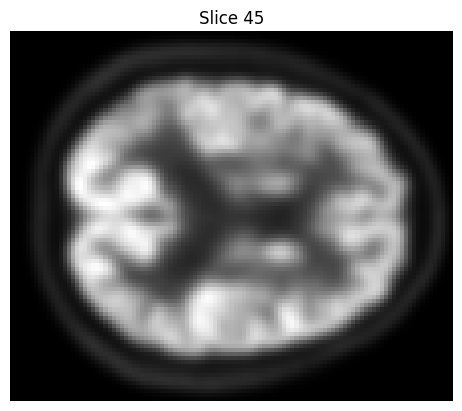

In [ ]:
import matplotlib.pyplot as plt

# Function to visualize a specific slice from a 3D NIfTI file
def visualize_slice(data, slice_index=None):
    if slice_index is None:
        slice_index = data.shape[2] // 2  # Default to the middle slice

    plt.imshow(data[:, :, slice_index], cmap='gray')
    plt.title(f'Slice {slice_index}')
    plt.axis('off')
    plt.show()

# Visualize a slice from the first loaded file
visualize_slice(data_list[0])


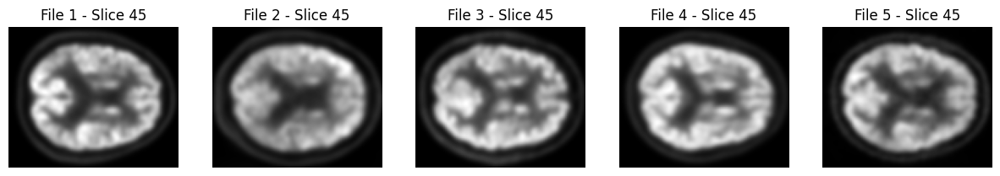

In [ ]:
import matplotlib.pyplot as plt

# Function to create a montage of slices from multiple NIfTI files
def create_montage(data_list, num_slices=5, slice_index=None):
    plt.figure(figsize=(15, 3 * num_slices))
    for i in range(num_slices):
        plt.subplot(1, num_slices, i + 1)
        data = data_list[i]
        if slice_index is None:
            slice_index = data.shape[2] // 2  # Default to the middle slice
        plt.imshow(data[:, :, slice_index], cmap='gray')
        plt.title(f'File {i+1} - Slice {slice_index}')
        plt.axis('off')
    plt.show()

# Create a montage of the first 5 files
create_montage(data_list, num_slices=5)


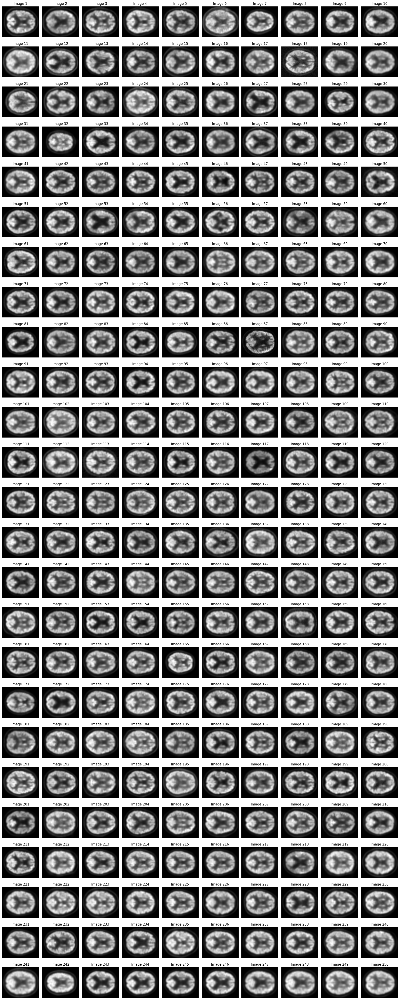

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to create a montage of slices from multiple NIfTI files
def create_montage(data_list, slice_index=None):
    num_images = len(data_list)
    num_cols = 10  # Define the number of columns in the montage
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 2))
    for i, ax in enumerate(axes.flat):
        if i < num_images:
            data = data_list[i]
            if slice_index is None:
                slice_index = data.shape[2] // 2  # Default to the middle slice
            ax.imshow(data[:, :, slice_index], cmap='gray')
            ax.set_title(f'Image {i+1}')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Create a montage of all 250 images
create_montage(data_list)


In [ ]:
import numpy as np

# Calculate the global mean and standard deviation
all_data = np.concatenate([data.flatten() for data in data_list])
global_mean = np.mean(all_data)
global_std = np.std(all_data)

print(f"Global Mean: {global_mean}")
print(f"Global Std: {global_std}")


Global Mean: 13.795167342745117
Global Std: 369.3097433838542


In [ ]:
# Function to standardize each image
# Function to min-max standardize each image to the range [0, 1]
def min_max_standardize_image(data, data_min, data_max):
    standardized_data = (data - data_min) / (data_max - data_min)
    return standardized_data

# Calculate global min and max
global_min = np.min([np.min(data) for data in data_list])
global_max = np.max([np.max(data) for data in data_list])

# Apply min-max standardization to each image
standardized_data_list = [min_max_standardize_image(data, global_min, global_max) for data in data_list]

# # Verify the standardization
# standardized_means = [np.mean(data) for data in standardized_data_list]
# standardized_stds = [np.std(data) for data in standardized_data_list]

# print("Standardized Means:", standardized_means)
# print("Standardized Stds:", standardized_stds)

# Verify the min-max standardization
standardized_mins = [np.min(data) for data in standardized_data_list]
standardized_maxs = [np.max(data) for data in standardized_data_list]

print("Standardized Mins:", standardized_mins)
print("Standardized Maxs:", standardized_maxs)


Standardized Mins: [0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287039883591935, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.0, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389595149858, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.08287389833753926, 0.0828738

In [ ]:
# import numpy as np

# # Function to standardize each image
# def standardize_image(data, mean, std):
#     standardized_data = (data - mean) / std
#     return standardized_data

# # Apply standardization to each image
# standardized_data_list = [standardize_image(data, global_mean, global_std) for data in data_list]

# # Calculate means and stds after standardization
# standardized_means = [np.mean(data) for data in standardized_data_list]
# standardized_stds = [np.std(data) for data in standardized_data_list]

# # Identify the outlier index (in this case, Image 18)
# outlier_index = 17  # Python indices are 0-based

# # Remove the outlier
# standardized_data_list.pop(outlier_index)
# standardized_means.pop(outlier_index)
# standardized_stds.pop(outlier_index)

# print("Outlier removed.")

# # Verify the standardization after removing the outlier
# print("Standardized Means (should be close to 0):", standardized_means[:10])  # Print the first 10 for brevity
# print("Standardized Stds (should be close to 1):", standardized_stds[:10])    # Print the first 10 for brevity

# # Additional check for consistency
# overall_standardized_mean = np.mean(standardized_means)
# overall_standardized_std = np.std(standardized_stds)

# print(f"Overall Standardized Mean: {overall_standardized_mean}")
# print(f"Overall Standardized Std: {overall_standardized_std}")


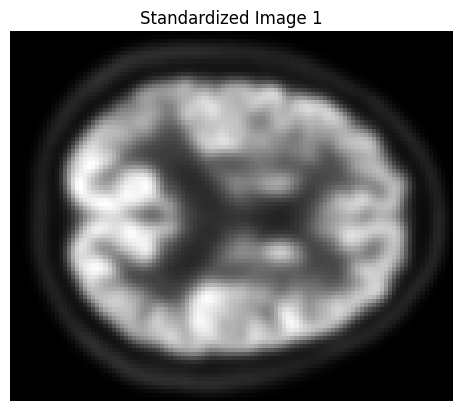

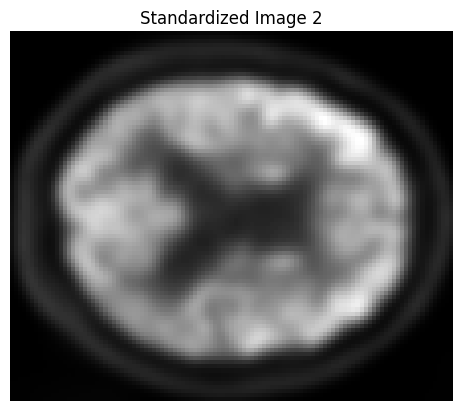

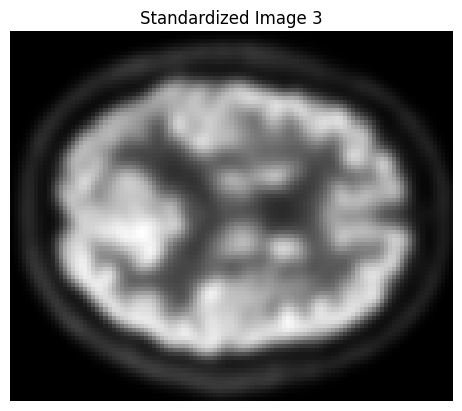

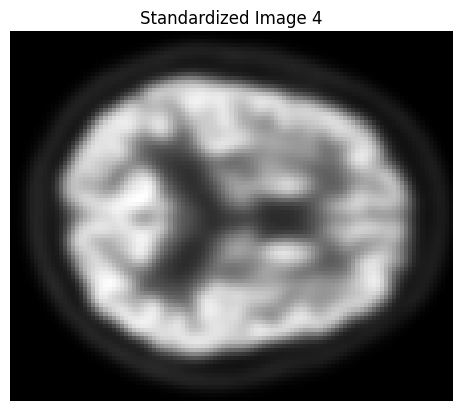

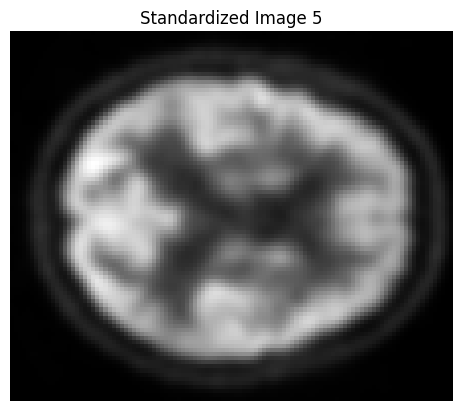

In [ ]:
import matplotlib.pyplot as plt

# Function to visualize a specific slice from a 3D NIfTI file
def visualize_slice(data, slice_index=None, title="Slice"):
    if slice_index is None:
        slice_index = data.shape[2] // 2  # Default to the middle slice
    plt.imshow(data[:, :, slice_index], cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Visualize a slice from the first few standardized images
for i in range(5):
    visualize_slice(standardized_data_list[i], title=f"Standardized Image {i+1}")


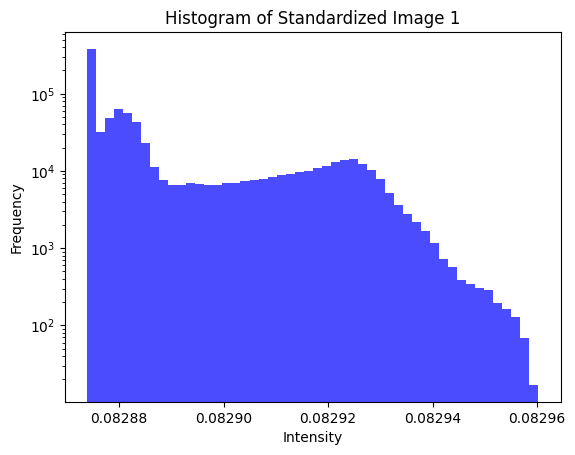

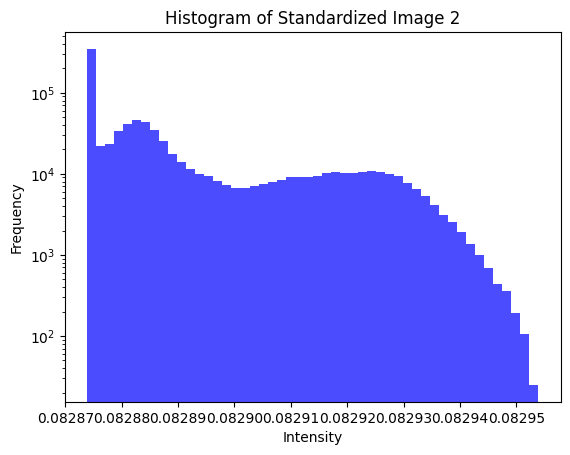

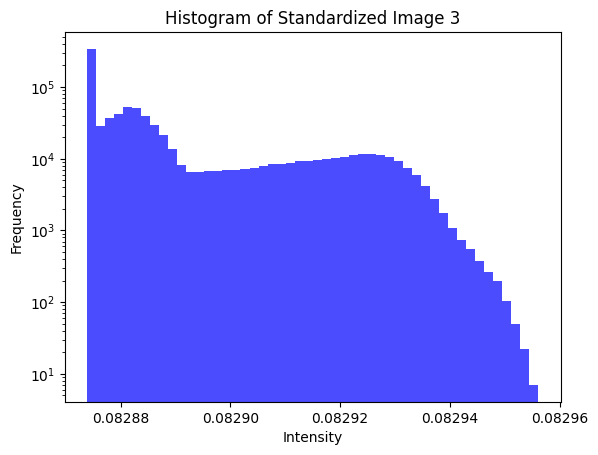

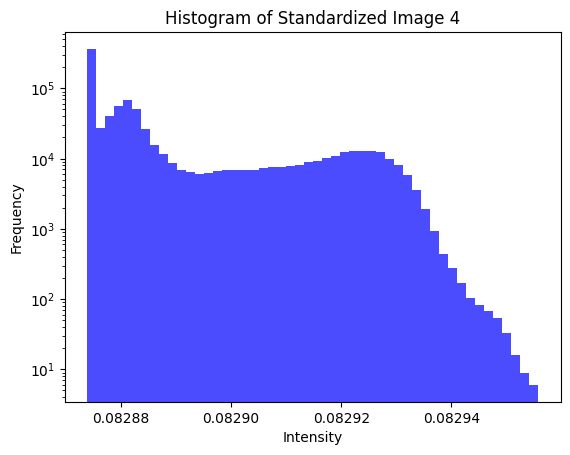

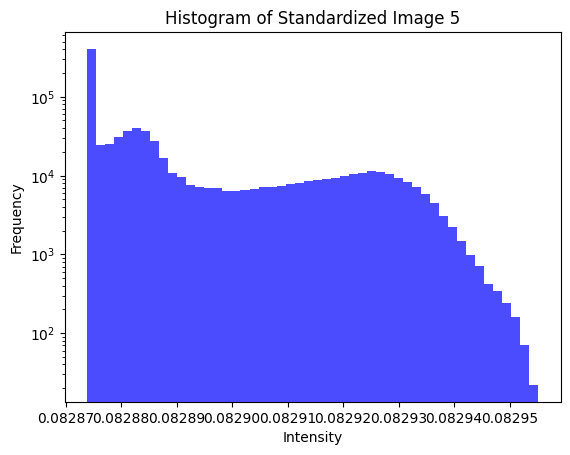

In [ ]:
# Function to plot histogram of intensity values
def plot_histogram(data, title="Intensity Distribution"):
    plt.hist(data.flatten(), bins=50, color='blue', alpha=0.7)
    plt.yscale("log")
    plt.title(title)
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    plt.show()

# Plot histogram for the first few standardized images
for i in range(5):
    plot_histogram(standardized_data_list[i], title=f"Histogram of Standardized Image {i+1}")


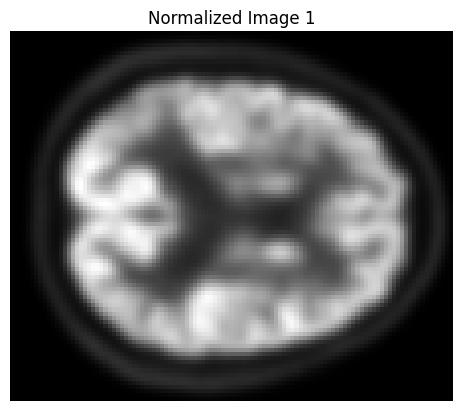

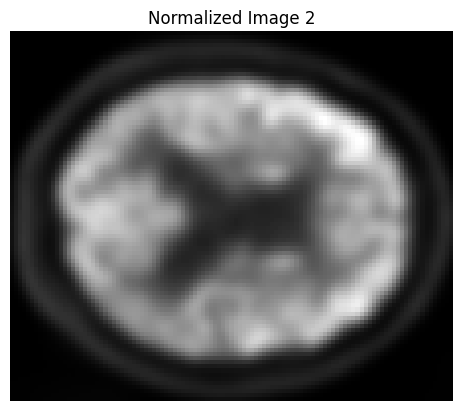

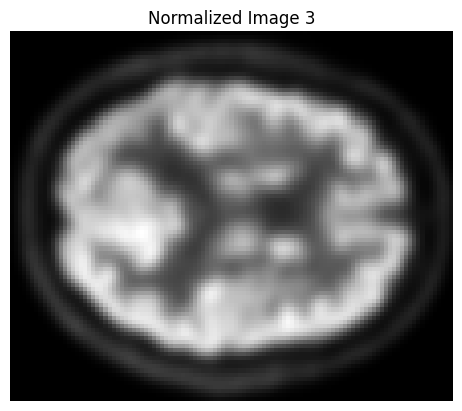

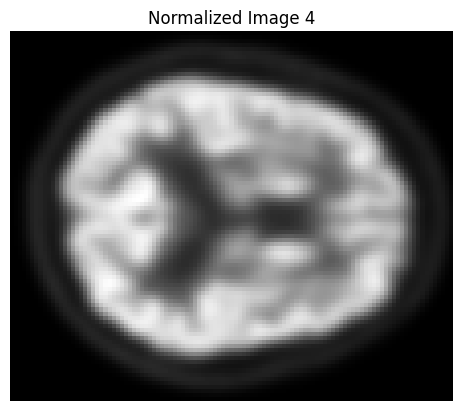

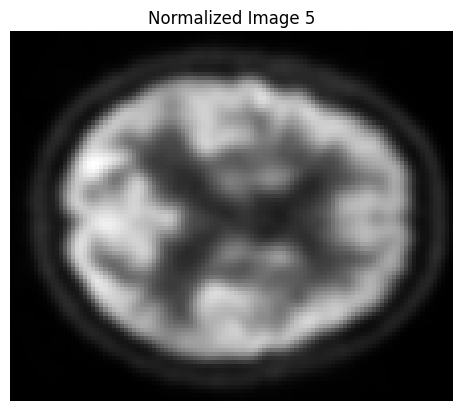

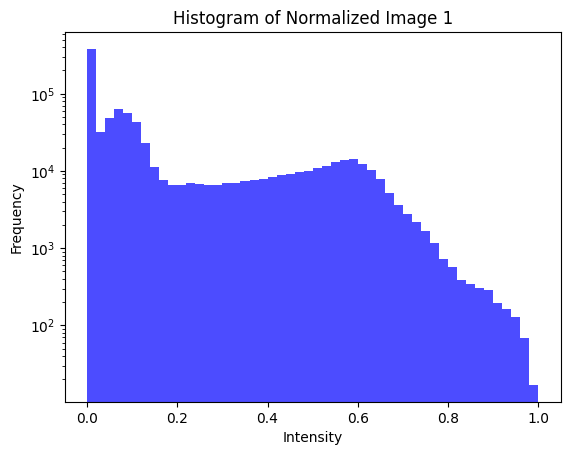

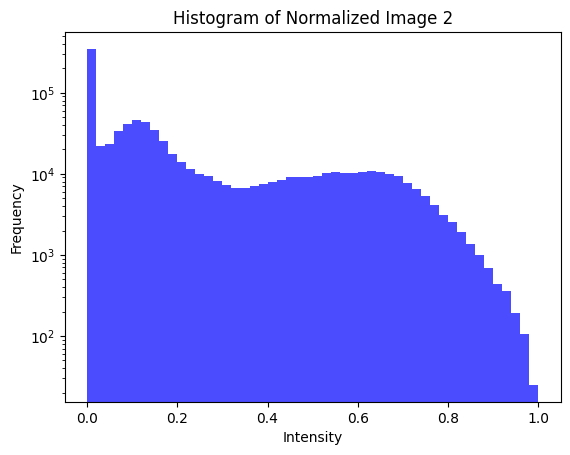

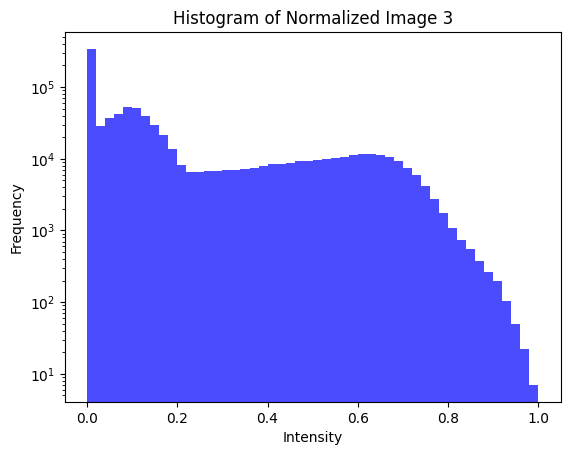

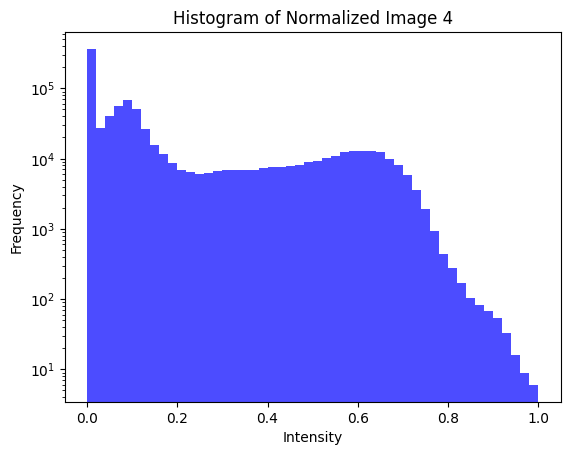

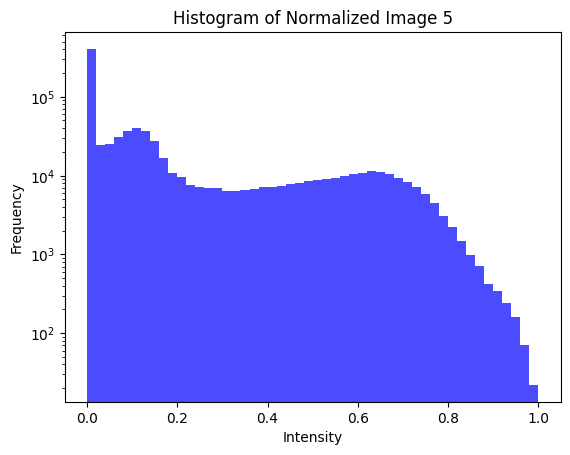

In [ ]:
# Function to normalize data to the range [0, 1]
def normalize_image(data):
    min_val = np.min(data)
    max_val = np.max(data)
    normalized_data = (data - min_val) / (max_val - min_val)
    return normalized_data

# Apply normalization to each standardized image
normalized_data_list = [normalize_image(data) for data in standardized_data_list]

# Visualize a slice from the first few normalized images
for i in range(5):
    visualize_slice(normalized_data_list[i], title=f"Normalized Image {i+1}")

# Plot histogram for the first few normalized images
for i in range(5):
    plot_histogram(normalized_data_list[i], title=f"Histogram of Normalized Image {i+1}")


In [ ]:
# Function to check if an image is normalized
def is_normalized(data):
    return np.min(data) >= 0 and np.max(data) <= 1

# Check normalization for all images
all_normalized = True
for i, data in enumerate(normalized_data_list):
    if not is_normalized(data):
        print(f"Image {i+1} is not normalized.")
        all_normalized = False

if all_normalized:
    print("All images are normalized.")
else:
    print("Some images are not normalized.")


All images are normalized.


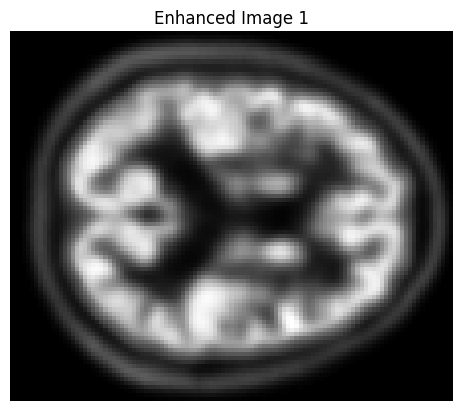

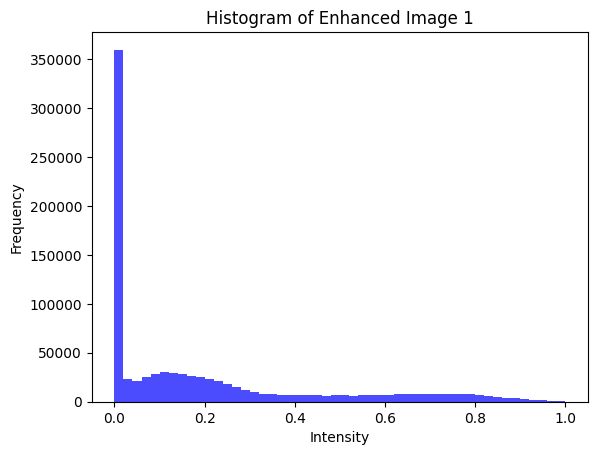

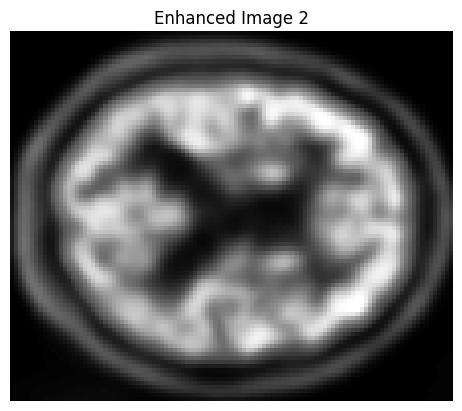

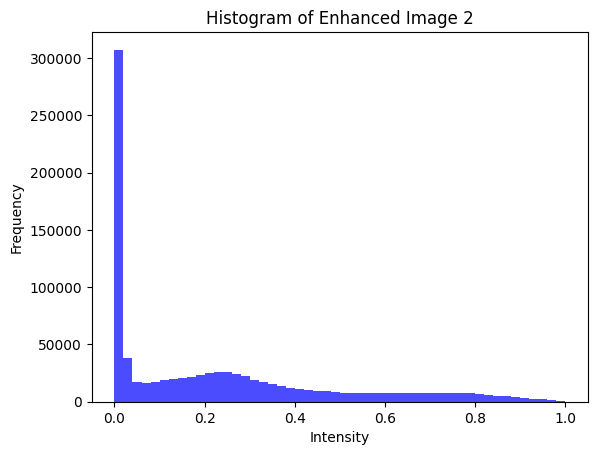

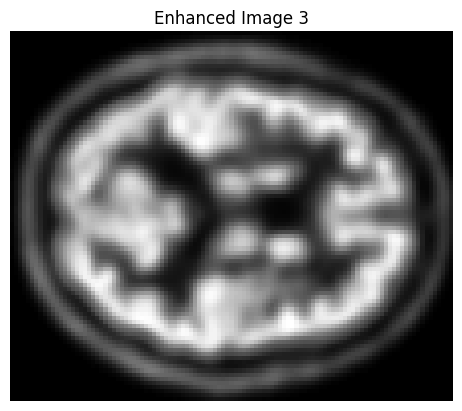

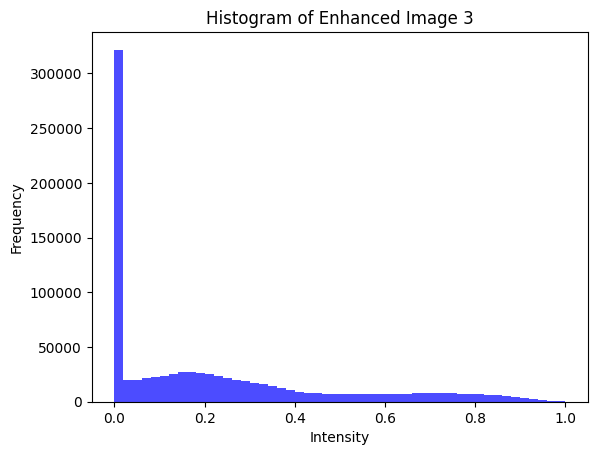

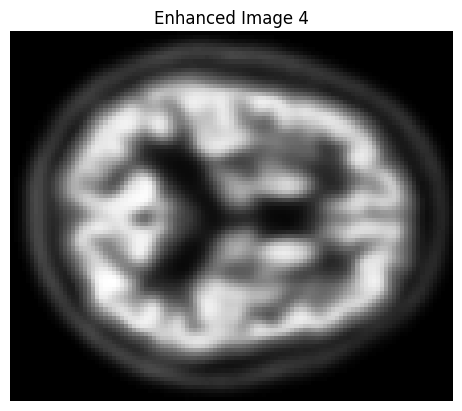

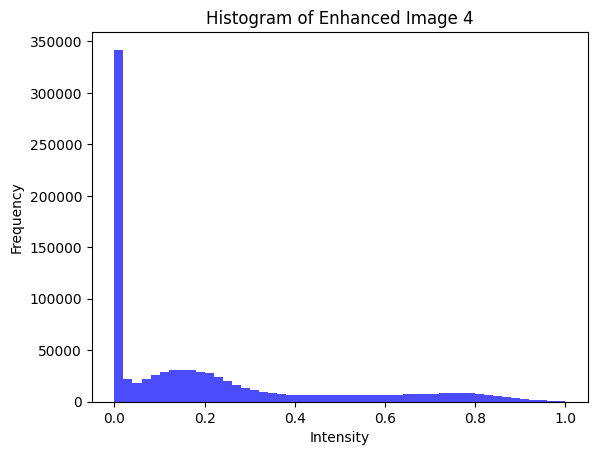

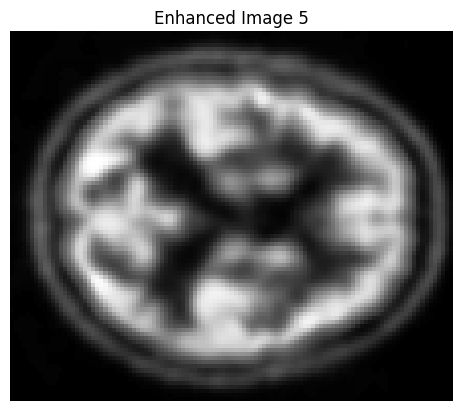

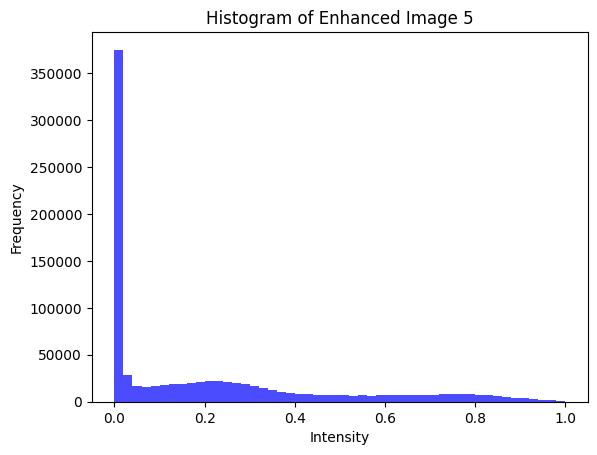

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure

# Function to enhance the contrast of an image using adaptive histogram equalization
def enhance_contrast(data):
    enhanced_data = exposure.equalize_adapthist(data)
    return enhanced_data

# Function to visualize a specific slice from a 3D NIfTI file
def visualize_slice(data, slice_index=None, title="Slice"):
    if slice_index is None:
        slice_index = data.shape[2] // 2  # Default to the middle slice
    plt.imshow(data[:, :, slice_index], cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Function to plot histogram of intensity values
def plot_histogram(data, title="Intensity Distribution"):
    plt.hist(data.flatten(), bins=50, color='blue', alpha=0.7)
    plt.title(title)
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    plt.show()

# Initialize the list to store enhanced images if needed
enhanced_data_list = []

# Process and visualize each image one by one
for i, data in enumerate(normalized_data_list):
    enhanced_data = enhance_contrast(data)

    if i < 5:  # Only visualize the first few images
        visualize_slice(enhanced_data, title=f"Enhanced Image {i+1}")
        plot_histogram(enhanced_data, title=f"Histogram of Enhanced Image {i+1}")

    # Optionally, save the processed images to a list or file if needed
    enhanced_data_list.append(enhanced_data)



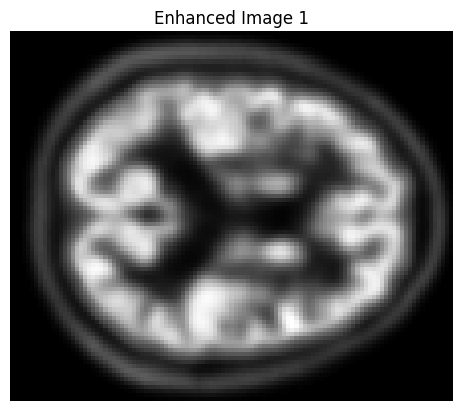

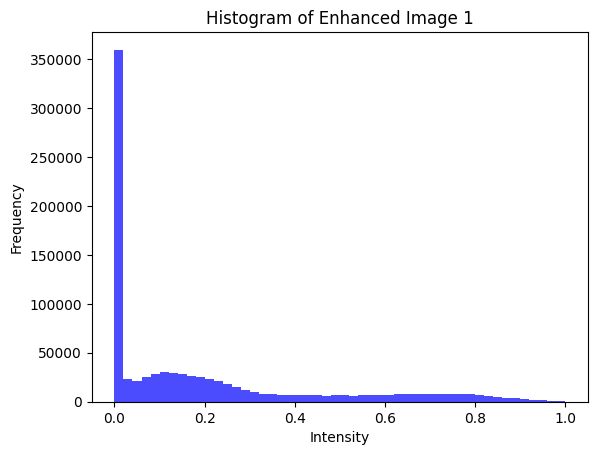

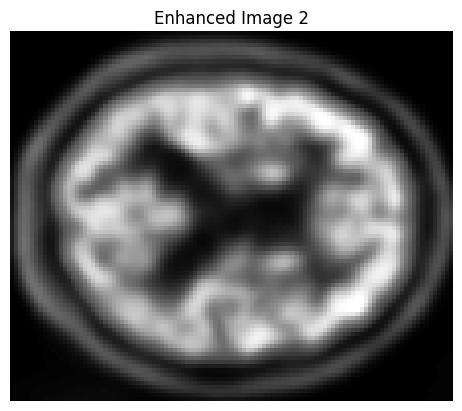

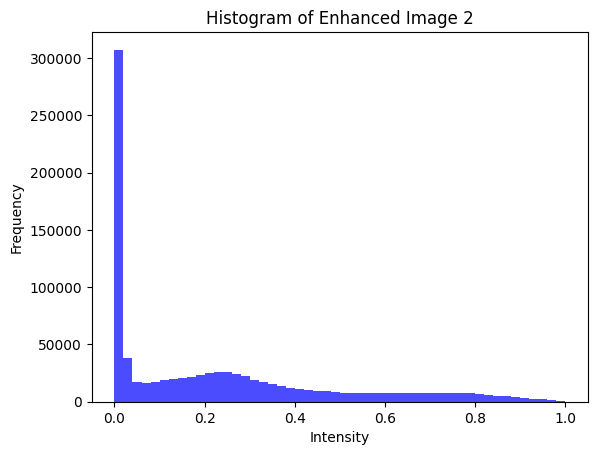

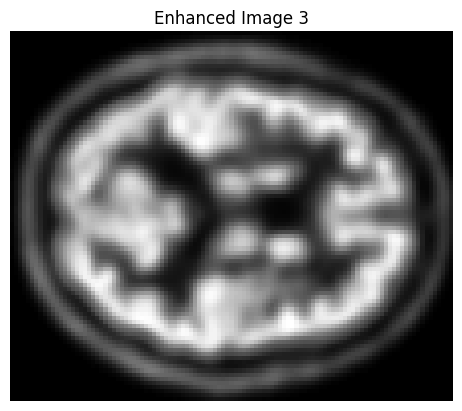

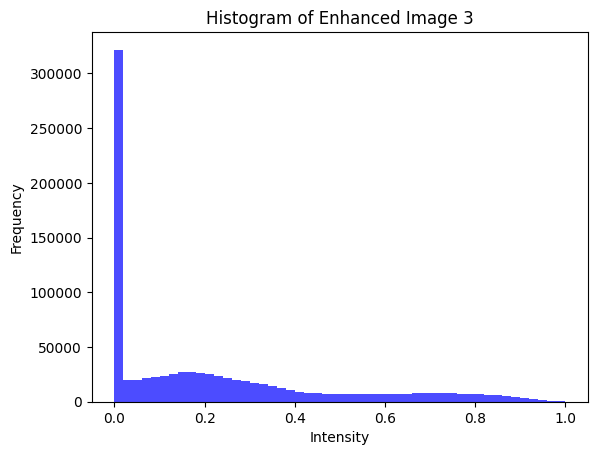

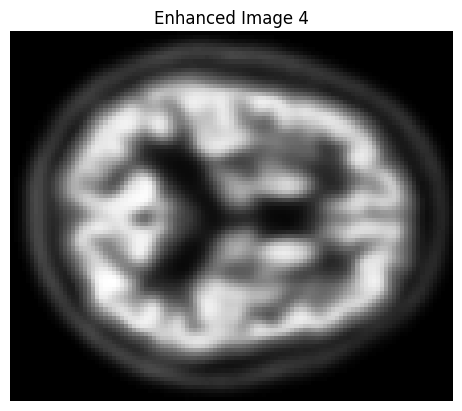

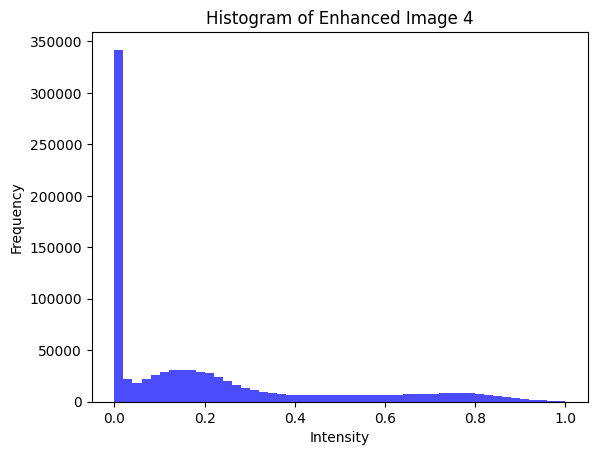

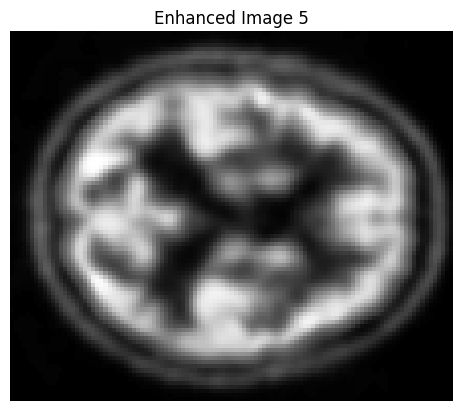

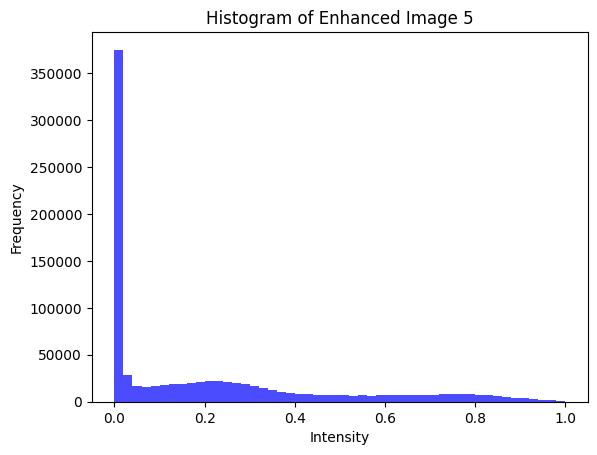

   mean_intensity  std_intensity  skewness  kurtosis
0        0.198092       0.252417  1.313273  0.562488
1        0.230304       0.255406  1.059260  0.102874
2        0.222768       0.256225  1.144955  0.247051
3        0.206482       0.254171  1.274105  0.485003
4        0.212942       0.261697  1.201248  0.308728


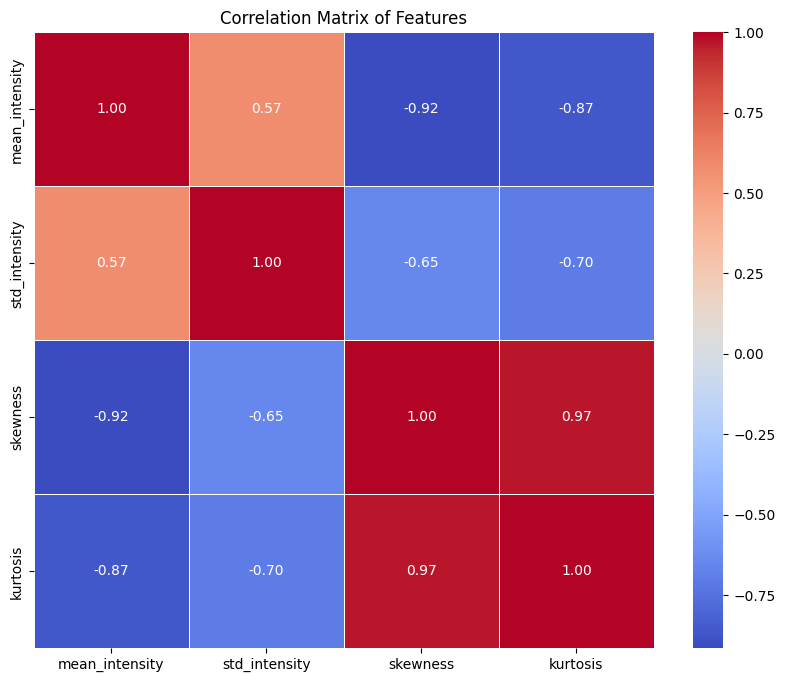

   Principal Component 1  Principal Component 2  Principal Component 3
0               0.009044              -0.016386              -0.002587
1              -0.510018               0.069566              -0.003222
2              -0.345295               0.037365               0.000540
3              -0.077364              -0.004868               0.000859
4              -0.268058               0.004171              -0.001028


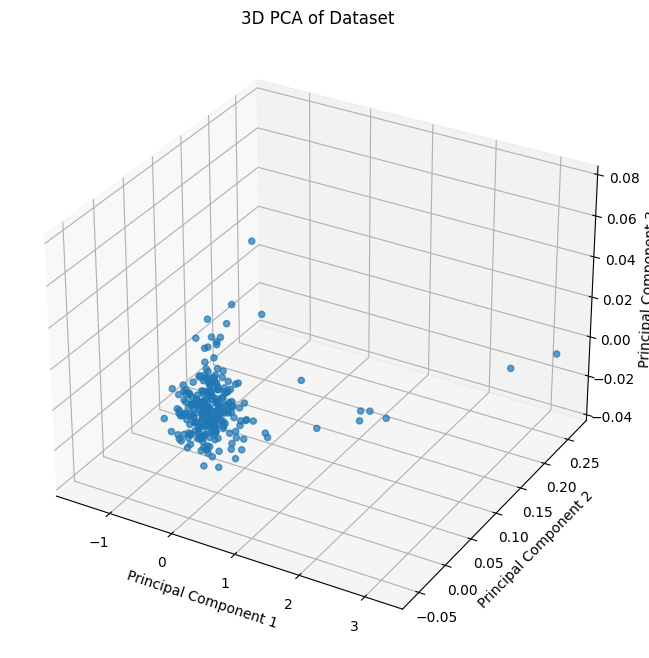

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
import pandas as pd
import seaborn as sns
from scipy.stats import skew, kurtosis
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Function to visualize a specific slice from a 3D NIfTI file
def visualize_slice(data, slice_index=None, title="Slice"):
    if slice_index is None:
        slice_index = data.shape[2] // 2  # Default to the middle slice
    plt.imshow(data[:, :, slice_index], cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Function to plot histogram of intensity values
def plot_histogram(data, title="Intensity Distribution"):
    plt.hist(data.flatten(), bins=50, color='blue', alpha=0.7)
    plt.title(title)
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    plt.show()

# Initialize lists to store features
mean_intensity_list = []
std_intensity_list = []
skewness_list = []
kurtosis_list = []

# Process each image one by one
for i, data in enumerate(enhanced_data_list):
    # Extract features without applying mask
    mean_intensity = np.mean(data)
    std_intensity = np.std(data)
    skewness_value = skew(data.flatten())
    kurtosis_value = kurtosis(data.flatten())

    mean_intensity_list.append(mean_intensity)
    std_intensity_list.append(std_intensity)
    skewness_list.append(skewness_value)
    kurtosis_list.append(kurtosis_value)

    # Visualize the first few images
    if i < 5:
        visualize_slice(data, title=f"Enhanced Image {i+1}")
        plot_histogram(data, title=f"Histogram of Enhanced Image {i+1}")

# Create a DataFrame with the extracted features
feature_data = {
    'mean_intensity': mean_intensity_list,
    'std_intensity': std_intensity_list,
    'skewness': skewness_list,
    'kurtosis': kurtosis_list
}

df = pd.DataFrame(feature_data)

print(df.head())

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5)

# Show the plot
plt.title('Correlation Matrix of Features')
plt.show()

# Apply PCA to reduce the dataset to three dimensions
pca_3d = PCA(n_components=3)
principal_components_3d = pca_3d.fit_transform(df)

# Create a DataFrame with the three principal components
pca_df_3d = pd.DataFrame(data=principal_components_3d, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'])

print(pca_df_3d.head())

# 3D scatter plot of the first three principal components
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(pca_df_3d['Principal Component 1'], pca_df_3d['Principal Component 2'], pca_df_3d['Principal Component 3'], alpha=0.7)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA of Dataset')

plt.show()


In [ ]:
# Get the loadings (coefficients of the principal components)
loadings_3d = pca_3d.components_

# Create a DataFrame for the loadings
loadings_df_3d = pd.DataFrame(loadings_3d, columns=df.columns, index=[f'PC{i+1}' for i in range(loadings_3d.shape[0])])

print(loadings_df_3d)


     mean_intensity  std_intensity  skewness  kurtosis
PC1       -0.037453      -0.012868  0.335540  0.941193
PC2        0.155474      -0.033000 -0.928131  0.336619
PC3        0.986259       0.046681  0.157635 -0.016313


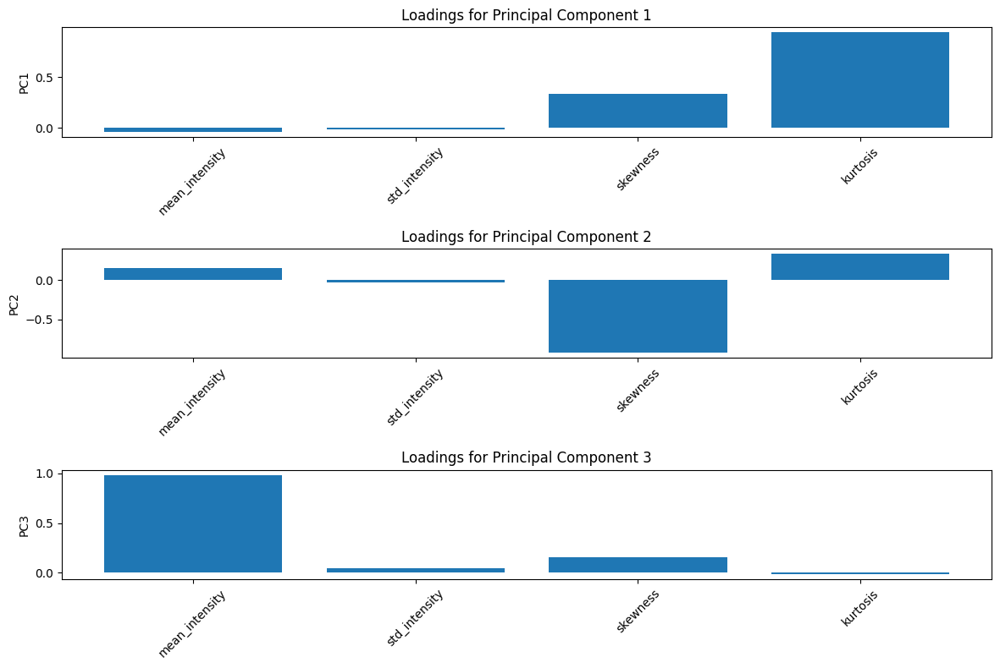

In [ ]:
#visualize the loadings
import matplotlib.pyplot as plt

# Plot the loadings for each principal component
plt.figure(figsize=(12, 8))

for i in range(loadings_df_3d.shape[0]):
    plt.subplot(3, 1, i + 1)
    plt.bar(loadings_df_3d.columns, loadings_df_3d.iloc[i])
    plt.ylabel(f'PC{i+1}')
    plt.xticks(rotation=45)
    plt.title(f'Loadings for Principal Component {i+1}')

plt.tight_layout()
plt.show()


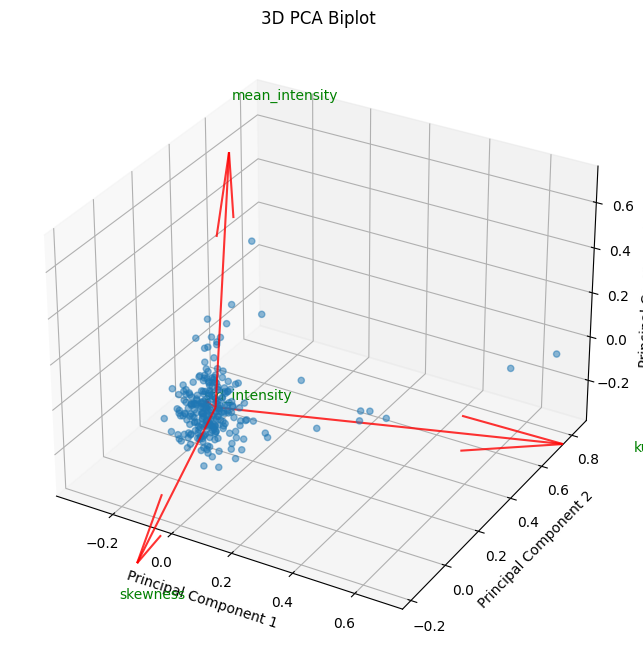

In [ ]:
#A biplot shows both the principal components and the loadings of the original features

import matplotlib.pyplot as plt

# Function to create a 3D biplot
def biplot_3d(score, coeff, labels=None):
    xs = score[:, 0]
    ys = score[:, 1]
    zs = score[:, 2]
    n = coeff.shape[0]
    scalex = 1.0 / (xs.max() - xs.min())
    scaley = 1.0 / (ys.max() - ys.min())
    scalez = 1.0 / (zs.max() - zs.min())

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(xs * scalex, ys * scaley, zs * scalez, alpha=0.5)

    for i in range(n):
        ax.quiver(0, 0, 0, coeff[i, 0], coeff[i, 1], coeff[i, 2], color='r', alpha=0.8)
        if labels is None:
            ax.text(coeff[i, 0] * 1.2, coeff[i, 1] * 1.2, coeff[i, 2] * 1.2, "Var" + str(i + 1), color='g')
        else:
            ax.text(coeff[i, 0] * 1.2, coeff[i, 1] * 1.2, coeff[i, 2] * 1.2, labels[i], color='g')

    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    ax.set_title('3D PCA Biplot')
    plt.show()

# Create the 3D biplot
biplot_3d(principal_components_3d, np.transpose(pca_3d.components_), labels=df.columns)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


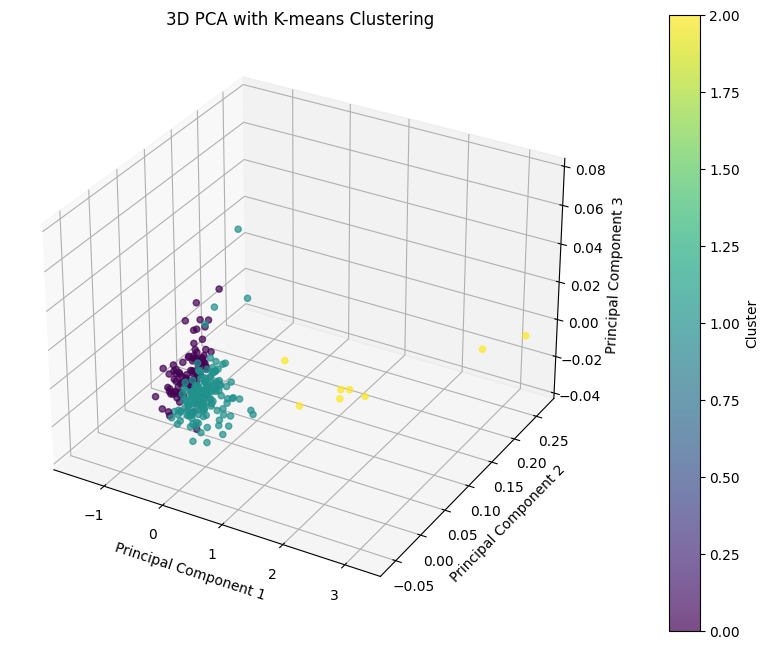

In [ ]:
from sklearn.cluster import KMeans

# Apply K-means clustering
kmeans = KMeans(n_clusters=3)  # Adjust the number of clusters as needed
kmeans.fit(principal_components_3d)
labels = kmeans.labels_

# Add the cluster labels to the PCA DataFrame
pca_df_3d['Cluster'] = labels

# 3D scatter plot of the clustered data points
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(pca_df_3d['Principal Component 1'], pca_df_3d['Principal Component 2'], pca_df_3d['Principal Component 3'], c=pca_df_3d['Cluster'], cmap='viridis', alpha=0.7)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA with K-means Clustering')

# Add a color bar to indicate clusters
cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label('Cluster')

plt.show()


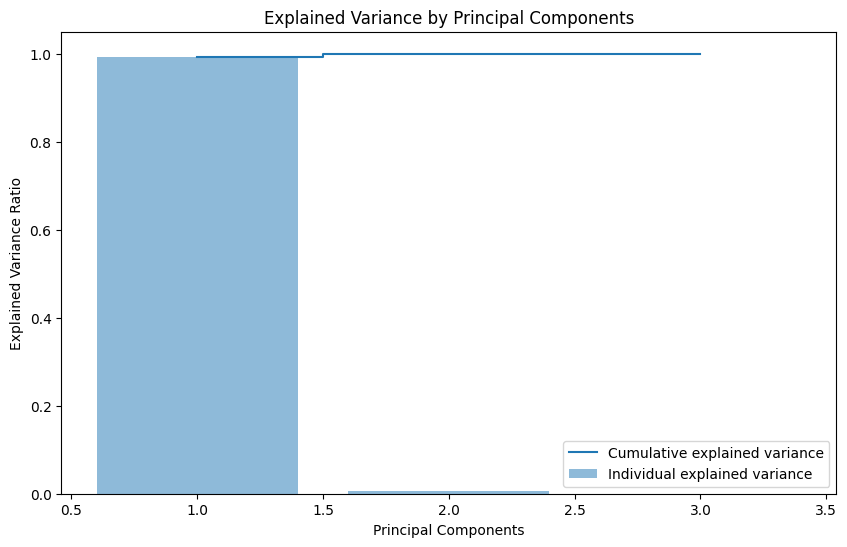

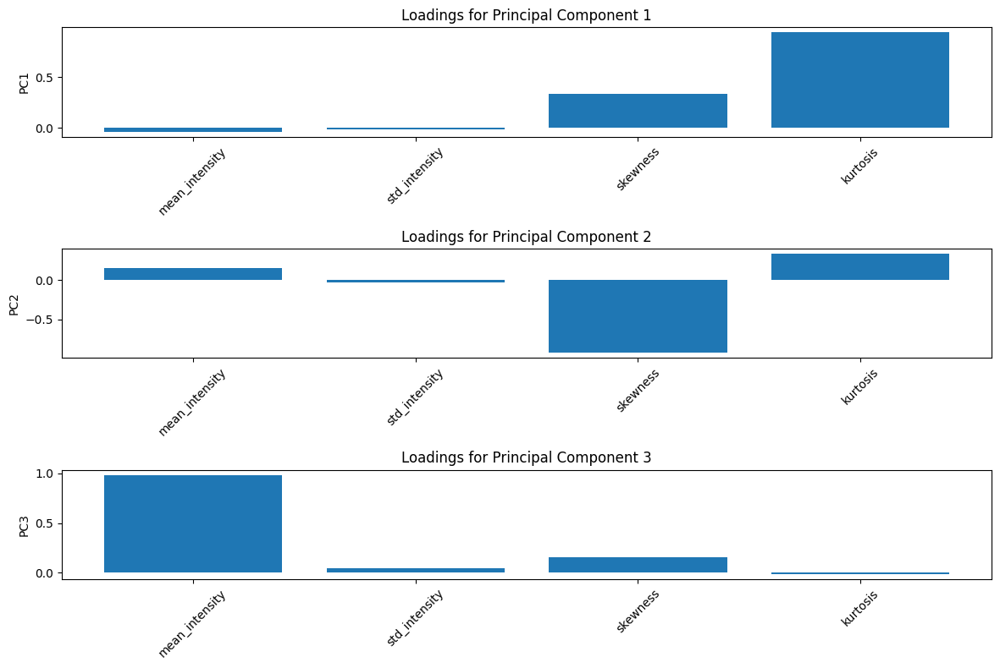

In [ ]:
#Visualize PCA components

# Variance explained by each principal component
explained_variance = pca_3d.explained_variance_ratio_

# Plotting the explained variance
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1, len(explained_variance) + 1), np.cumsum(explained_variance), where='mid', label='Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.title('Explained Variance by Principal Components')
plt.legend(loc='best')
plt.show()


# Plot the loadings for each principal component
plt.figure(figsize=(12, 8))

for i in range(loadings_df_3d.shape[0]):
    plt.subplot(3, 1, i + 1)
    plt.bar(loadings_df_3d.columns, loadings_df_3d.iloc[i])
    plt.ylabel(f'PC{i+1}')
    plt.xticks(rotation=45)
    plt.title(f'Loadings for Principal Component {i+1}')

plt.tight_layout()
plt.show()


In [ ]:
drive_path = '/content/drive/My Drive/'

# Save the PCA DataFrame with cluster labels to a CSV file
pca_df_3d.to_csv('pca_kmeans_output.csv', index=False)

# Save the original features DataFrame to a CSV file
df.to_csv('original_features.csv', index=False)

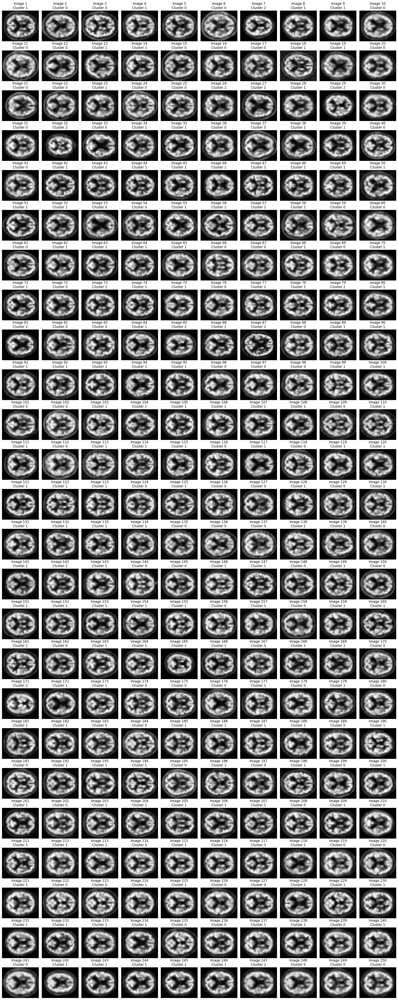

In [ ]:
# Function to create a montage of slices from multiple NIfTI files
def create_montage(data_list, labels, slice_index=None):
    num_images = len(data_list)
    num_cols = 10  # Define the number of columns in the montage
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 2))
    for i, ax in enumerate(axes.flat):
        if i < num_images:
            data = data_list[i]
            label = labels[i]
            if slice_index is None:
                slice_index = data.shape[2] // 2  # Default to the middle slice
            ax.imshow(data[:, :, slice_index], cmap='gray')
            ax.set_title(f'Image {i+1}\nCluster {label}')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Create the montage with the new cluster labels
create_montage(enhanced_data_list, labels)

In [ ]:
#Manifold Techniques
#t-SNE (t- distributed stochastic neighbor embedding) after PCA
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(principal_components_3d)

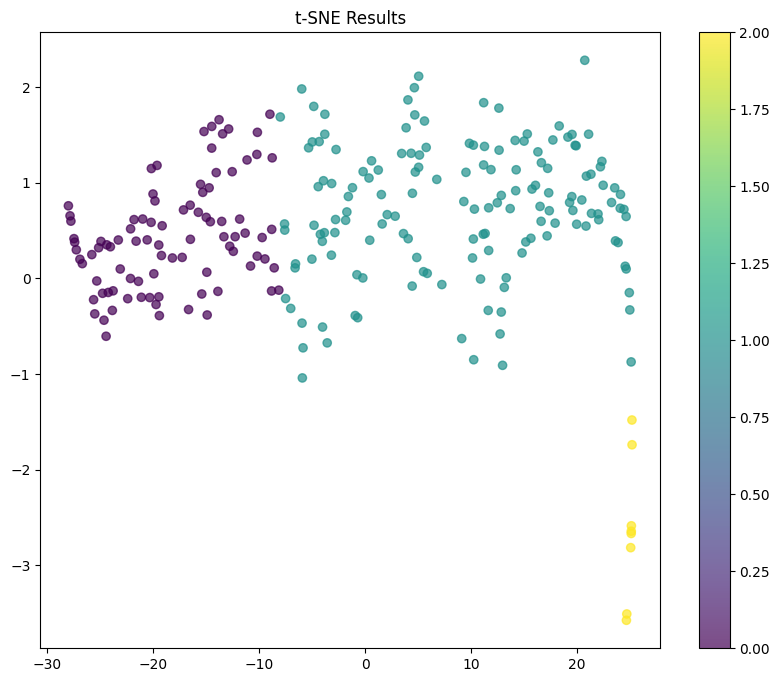

In [ ]:
#Plot t-SNE results
plt.figure(figsize=(10, 8))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap='viridis', alpha=0.7)
plt.title('t-SNE Results')
plt.colorbar()
plt.show()

In [ ]:
!pip install umap-learn


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE, Isomap
import umap

# UMAP (Uniform Manifold Approximation and Projection) after PCA
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_results = umap_reducer.fit_transform(principal_components_3d)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


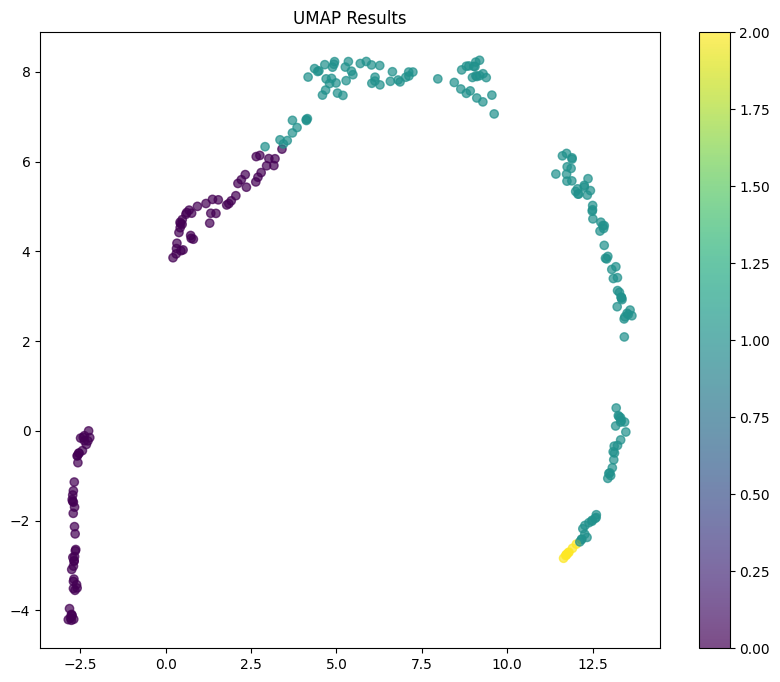

In [ ]:
# Plot UMAP results
plt.figure(figsize=(10, 8))
plt.scatter(umap_results[:, 0], umap_results[:, 1], c=labels, cmap='viridis', alpha=0.7)
plt.title('UMAP Results')
plt.colorbar()
plt.show()

In [ ]:

from sklearn.manifold import Isomap

# Isomap after PCA
isomap = Isomap(n_components=2)
isomap_results = isomap.fit_transform(principal_components_3d)

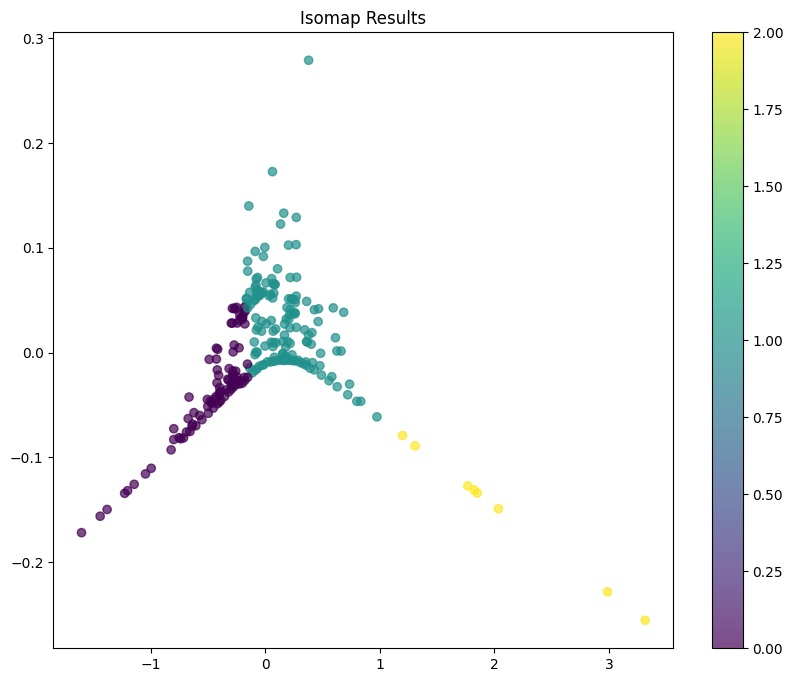

In [ ]:
# Plot Isomap results
plt.figure(figsize=(10, 8))
plt.scatter(isomap_results[:, 0], isomap_results[:, 1], c=labels, cmap='viridis', alpha=0.7)
plt.title('Isomap Results')
plt.colorbar()
plt.show()

In [ ]:
# Save the results to CSV files
tsne_df = pd.DataFrame(tsne_results, columns=['TSNE1', 'TSNE2'])
tsne_df['Label'] = labels
tsne_df.to_csv('tsne_results.csv', index=False)

umap_df = pd.DataFrame(umap_results, columns=['UMAP1', 'UMAP2'])
umap_df['Label'] = labels
umap_df.to_csv('umap_results.csv', index=False)

isomap_df = pd.DataFrame(isomap_results, columns=['ISOMAP1', 'ISOMAP2'])
isomap_df['Label'] = labels
isomap_df.to_csv('isomap_results.csv', index=False)

print("t-SNE, UMAP, and Isomap results saved to CSV files.")

t-SNE, UMAP, and Isomap results saved to CSV files.
